In [1]:
include("source.jl")



load_skew_model (generic function with 1 method)

# construct grids

In [2]:
x= collect(LinRange(-pi,pi,101))
y = collect(LinRange(-pi,pi,101))
UPC = 1
fine_mesh = gen_mesh(x,y,UPC = UPC)

# number of unknowns per cell

J = (10,10) # compression in each direction
coarse_mesh = generate_coarse_from_fine_mesh(fine_mesh,J)
MP = gen_mesh_pair(fine_mesh,coarse_mesh)
0



┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = ConvTranspose((10, 10), 1 => 1, stride=10, bias=false)  # 100 parameters
│   summary(x) = "10×10×1×1 Array{Float64, 4}"
└ @ Flux ~/.julia/packages/Flux/HdfYB/src/layers/stateless.jl:60


0

# Function for RHS

In [3]:
function gen_conv_stencil(weights)
    widths = [(Int.(([size(weights)[1:end]...] .- 1) ./ 2)...,)]
    conv_stencil = conv_NN(widths,[1,1],[(1,1)],false)
    conv_stencil[1].weight[[(:) for i in 1:length(widths[1])]...] = weights#reverse(weights)
    return conv_stencil#conv_stencil
end

function gen_conv_advection_rhs(speed,viscosity)
    conv_D1 = gen_conv_stencil([[0, 1, 0];;[1, 0, -1];;[0, -1, 0]])
    conv_D2 = gen_conv_stencil([[0, 1, 0];;[1, -4, 1];;[0, 1, 0]])
    function advection_rhs(u,mesh,t,D1=conv_D1,D2 = conv_D2,viscosity =  viscosity,speed = speed)

        dx = mesh.omega[1,1]


        A = 1/(2*dx) * D1(u)
        B = (1/(dx^2))*D2(u)

        return -speed*A .+ viscosity*B
    end
    return advection_rhs
end



function gen_conv_burgers_rhs(viscosity)
    conv_D1 = gen_conv_stencil([[0, 1, 0];;[1, 0, -1];;[0, -1, 0]])
    conv_D2 = gen_conv_stencil([[0, 1, 0];;[1, -4, 1];;[0, 1, 0]])
    function burgers_rhs(u,mesh,t,D1=conv_D1,D2 = conv_D2,viscosity =  viscosity)

        dx = mesh.omega[1,1]


        A = 1/(2*dx) * 1/3 .* D1(u.^2)
        B = 1/(2*dx) * 1/3 * u[2:end-1,2:end-1,:,:] .* D1(u)
        
        
        C = (1/(dx^2))*D2(u)

        return -(A+B) .+ viscosity*C
    end
    return burgers_rhs
end


dudt = gen_conv_advection_rhs(0.1,0.00001)
#dudt = gen_conv_burgers_rhs(0.00005)

rhs(u,mesh,t;dudt = dudt,other_arguments = 0) = dudt(padding(u,(1,1),circular = true),mesh,t)

rhs (generic function with 1 method)

# Initial conditions

In [9]:
max_k = 10
energy_norm = 1
number_of_simulations = 5

init_conds = generate_random_field(fine_mesh.N,max_k,norm = energy_norm,samples = (1,number_of_simulations))


100×100×1×5 Array{Float64, 4}:
[:, :, 1, 1] =
  0.265392    0.450132    0.488451   …  -0.808637  -0.425979   -0.0439005
  0.0751758   0.0476289  -0.0984401     -0.490882  -0.229214   -0.0244745
 -0.123944   -0.330403   -0.61364       -0.16462   -0.0498428  -0.0286083
 -0.296082   -0.625433   -0.982214       0.132017   0.0965867  -0.0462042
 -0.402967   -0.78578    -1.14767        0.368433   0.204486   -0.0589592
 -0.413025   -0.777899   -1.08326    …   0.528184   0.278615   -0.0453997
 -0.3104     -0.595429   -0.798839       0.611674   0.331311    0.0122939
 -0.101582   -0.263718   -0.341455       0.634228   0.377314    0.121459
  0.182421    0.161749    0.21074        0.620267   0.427789    0.274204
  0.489633    0.603468    0.760825       0.595469   0.485524    0.446499
  0.756273    0.975551    1.20975    …   0.579379   0.543025    0.60197
  0.919985    1.20046     1.47439        0.580703   0.58438     0.699953
  0.934322    1.22548     1.50359        0.596595   0.590558    0.706072

In [10]:
init_conds

100×100×1×5 Array{Float64, 4}:
[:, :, 1, 1] =
  0.265392    0.450132    0.488451   …  -0.808637  -0.425979   -0.0439005
  0.0751758   0.0476289  -0.0984401     -0.490882  -0.229214   -0.0244745
 -0.123944   -0.330403   -0.61364       -0.16462   -0.0498428  -0.0286083
 -0.296082   -0.625433   -0.982214       0.132017   0.0965867  -0.0462042
 -0.402967   -0.78578    -1.14767        0.368433   0.204486   -0.0589592
 -0.413025   -0.777899   -1.08326    …   0.528184   0.278615   -0.0453997
 -0.3104     -0.595429   -0.798839       0.611674   0.331311    0.0122939
 -0.101582   -0.263718   -0.341455       0.634228   0.377314    0.121459
  0.182421    0.161749    0.21074        0.620267   0.427789    0.274204
  0.489633    0.603468    0.760825       0.595469   0.485524    0.446499
  0.756273    0.975551    1.20975    …   0.579379   0.543025    0.60197
  0.919985    1.20046     1.47439        0.580703   0.58438     0.699953
  0.934322    1.22548     1.50359        0.596595   0.590558    0.706072

# Generate training data

In [11]:
t_start = 0
t_end = 10
dt = 0.01
save_every = 5
pre_allocate = true


t_data,sim_data = simulate(init_conds,fine_mesh,dt,t_start,t_end,rhs,time_step,save_every = save_every,pre_allocate = pre_allocate) 
0

0

# Local POD

In [12]:
data = reshape(sim_data,(size(sim_data)[1:end-2]...,prod(size(sim_data)[end-1:end])))


100×100×1×1000 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.229449     0.326455    0.80304    …  -1.46972    -1.21603    -0.775424
 -0.146948     0.228085    0.494104      -1.23486    -0.955714   -0.567716
 -0.0792599    0.0937759   0.144122      -0.88874    -0.631681   -0.340144
 -0.0342139   -0.0593579  -0.201783      -0.470179   -0.281079   -0.119308
 -0.0100411   -0.203237   -0.490656      -0.0355821   0.0534246   0.0720867
  0.00434628  -0.304219   -0.671563   …   0.354868    0.333429    0.220174
  0.0261331   -0.33097    -0.706536       0.652075    0.533495    0.322424
  0.0729943   -0.263192   -0.580351       0.829697    0.646268    0.386816
  0.156521    -0.0990106  -0.306769       0.889433    0.682634    0.427897
  0.276629     0.141155    0.0706977      0.858657    0.667034    0.460937
  0.418865     0.415833    0.484403   …   0.781376    0.629501    0.4961
  0.555884     0.669284    0.854099       0.705336    0.596911    0.534593
  0.653242     0.842851    1.10245        0.669093  

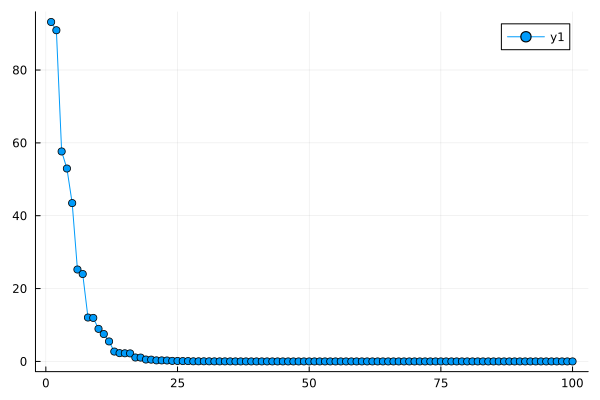

In [13]:
conserve_momentum = true
### momentum conserving correction of data set

data_hat = sqrt.(MP.omega_tilde) .* data
#reshape_for_local_SVD(data_hat,MP)

POD_modes,S = carry_out_local_SVD(data_hat,MP,subtract_average = conserve_momentum)

plot(S,marker = true)


In [15]:
r =5 #how many modes to include, including u_bar

if conserve_momentum 
    if r >= UPC + 1

        global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:(r-UPC)],MP)

    else
        global_POD_modes = 0
    end

    global_POD_modes = add_filter_to_modes(global_POD_modes,MP,orthogonalize = false)

else
    global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:r],MP)
end

PO = gen_projection_operators(global_POD_modes,MP,uniform =false)


projection_operators_struct(var"#Phi_T#64"{Array{Float64, 4}, mesh_pair_struct}([0.09999999920633415 0.09999999920633484 … 0.09999999920633484 0.09999999920633415; 0.09999999920633484 0.09999999920633555 … 0.09999999920633555 0.09999999920633484; … ; 0.09999999920633484 0.09999999920633555 … 0.09999999920633555 0.09999999920633484; 0.09999999920633415 0.09999999920633484 … 0.09999999920633484 0.09999999920633415;;;; -0.11684216690507274 -0.11977716910620294 … 0.05983562236576014 0.06748924279983326; -0.13624358498562336 -0.13778224859193547 … 0.07943090065557769 0.08809869344266101; … ; -0.08925903886149894 -0.08000070755289403 … 0.13798891868641175 0.136047924283769; -0.06941683638725155 -0.06108944713480048 … 0.12053368328472935 0.11723725107691635;;;; -0.06568437219628522 -0.08645464792552342 … -0.13634754855082076 -0.11712414455237553; -0.05977766874200877 -0.07978287267192363 … -0.13732904011163768 -0.11920009535828859; … ; 0.12448842377180536 0.14202223335884043 … 0.0760816578794

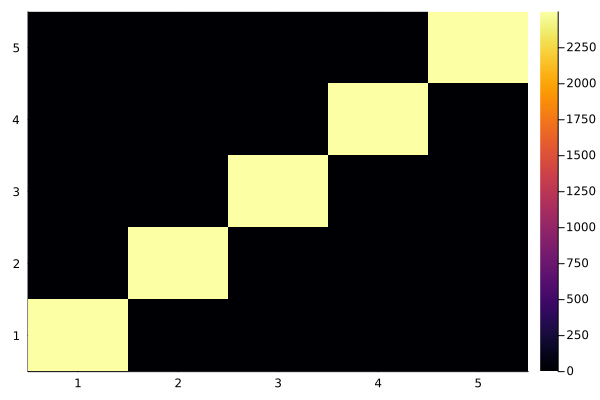

In [99]:
heatmap(compute_overlap_matrix(global_POD_modes))

# generate reference data

In [16]:
ref_rhs_data = PO.W(rhs(data,fine_mesh,0))
ref_data = PO.W(data)
E_ref = fine_mesh.ip(data,data)[1:end]
E_pod = coarse_mesh.ip(ref_data,ref_data,combine_channels = true)[1:end]

1000-element Vector{Float64}:
 34.5022497230502
 34.753944527898746
 34.44879616777736
 34.27691857519161
 34.39586651089695
 34.203329222237116
 34.208890363816174
 33.89824374503327
 33.68917403472944
 33.768851805554874
 33.96993336018921
 33.65524075448401
 33.70876397011259
  ⋮
  7.038974640420566
  7.508434803652132
  8.140699699468698
  9.254033884235845
  7.596925300329061
  6.995597126976025
  7.449905523750678
  8.104521965017176
  9.198522489541356
  7.563450047856048
  6.96562225090611
  7.399081448021945

In [17]:
mean(E_pod ./ E_ref)

0.9309275763403068

# Neural network

In [18]:

kernel_sizes = [(2,2),(1,1)]
channels = [r+1,20] # r+1 as the first channel for the rhs
strides = [(1,1),(1,1)]
B = (1,1)
boundary_padding = "c" #[["c","c"];;[0,0]]


constrain_energy =true
dissipation = true
conserve_momentum =true


model = gen_skew_NN(kernel_sizes,channels,strides,r,B,boundary_padding = boundary_padding,UPC = coarse_mesh.UPC,constrain_energy = constrain_energy,dissipation = dissipation,conserve_momentum = conserve_momentum)

skew_model_struct(var"#NN#198"{String, Bool, Bool, Bool, Int64, Tuple{Int64, Int64}, var"#NN#192#199", Vector{Array{Float64, 4}}, Chain{Tuple{Conv{2, 2, typeof(relu), Array{Float32, 4}, Vector{Float32}}, Conv{2, 2, typeof(identity), Array{Float32, 4}, Vector{Float32}}}}}(Core.Box(1), "c", true, true, true, 5, (1, 1), var"#NN#192#199"(Core.Box([0.15953709185123444 -0.13895867764949799 -0.10905246436595917; -0.20613981783390045 0.09768832474946976 -0.18164926767349243; -0.03543584421277046 0.17153604328632355 0.03153925761580467;;; -0.004727824591100216 0.2541295886039734 -0.0016919296467676759; 0.09507029503583908 -0.11916640400886536 0.1256248503923416; 0.07746879756450653 0.20201927423477173 -0.12689308822155;;; 0.1151159480214119 -0.23430851101875305 0.16436012089252472; 0.07054954767227173 0.03824403136968613 -0.07783325761556625; -0.11719539016485214 0.03900567442178726 0.24719011783599854;;; 0.2176811546087265 -0.20809407532215118 0.15179094672203064; -0.12616465985774994 0.244970

In [19]:
function neural_rhs(a,coarse_mesh,t,rhs = rhs,model = model,B=B;other_arguments = 0)
    dims = coarse_mesh.dims
    coarse_rhs = rhs(a[[(:) for i in 1:dims]...,1:1,:],coarse_mesh,t)
    input = cat(a,coarse_rhs,dims = dims + 1)
    


    
    nn_output = model.eval(input,a = padding(a,((2*[B...])...,),circular = true)) #+ channel_mask .* coarse_rhs
    
    
    
    channel_mask = gen_channel_mask(nn_output,1)

    #return  PO.W(rhs(PO.R(a),fine_mesh,t)) #+ channel_mask .* coarse_rhs  + (1 ./ coarse_mesh.omega) .* nn_output 
    return (1 ./ coarse_mesh.omega) .* nn_output +  channel_mask .* coarse_rhs    
end

neural_rhs (generic function with 4 methods)

┌ Warning: Slow fallback implementation invoked for conv!  You probably don't want this; check your datatypes.
│   yT = Float64
│   T1 = Float32
│   T2 = Float64
└ @ NNlib ~/.julia/packages/NNlib/lOntC/src/conv.jl:192


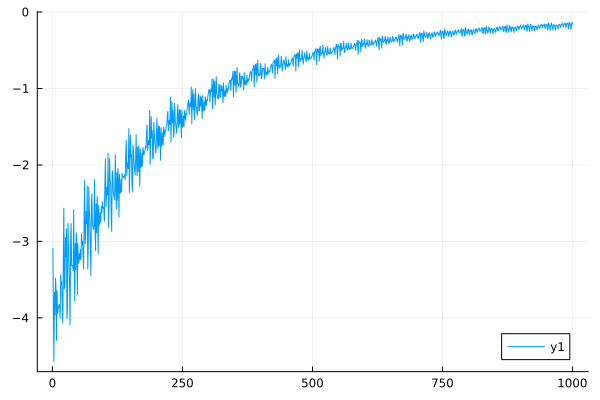

In [20]:
plot(coarse_mesh.ip(ref_data,neural_rhs(ref_data,coarse_mesh,0))[1:end]) # check if model is dissipative

# derivative fitting

In [21]:
batchsize = 5
derivative_fitting_data_loader = Flux.Data.DataLoader((ref_data,ref_rhs_data), batchsize=batchsize,shuffle=true)

200-element DataLoader(::Tuple{Array{Float32, 4}, Array{Float32, 4}}, shuffle=true, batchsize=5)
  with first element:
  (10×10×5×5 Array{Float32, 4}, 10×10×5×5 Array{Float32, 4},)

In [22]:
function derivative_fitting_loss(a,rhs_a,neural_rhs =neural_rhs,coarse_mesh = coarse_mesh)
    
    pred = neural_rhs(a,coarse_mesh,0)

    return Flux.Losses.mse(pred,rhs_a) #+ Flux.Losses.mse(coarse_mesh.ip(pred,a),coarse_mesh.ip(rhs_a,a))
end
    

derivative_fitting_loss (generic function with 3 methods)

In [23]:
sqrt.(derivative_fitting_loss(ref_data,ref_rhs_data))

2.589497522372123

In [24]:
opt = ADAM()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [25]:
ps = Flux.params(model.CNN,model.B_mats...)
#ps = Flux.params(model.CNN)
epochs =30
losses = zeros(epochs)
epoch = 0 
for epoch in tqdm(1:epochs)
    Flux.train!(derivative_fitting_loss,ps, derivative_fitting_data_loader, opt)
    train_loss = derivative_fitting_loss(ref_data,ref_rhs_data)
    losses[epoch] = train_loss
end

0.0%┣                                              ┫ 0/30 [00:01<00:-40, -1s/it]
┌ Warning: Slow fallback implementation invoked for ∇conv_filter!  You probably don't want this; check your datatypes.
│   yT = Float64
│   T1 = Float32
│   T2 = Float64
└ @ NNlib ~/.julia/packages/NNlib/lOntC/src/conv.jl:276
3.3%┣█▍                                         ┫ 1/30 [01:20<Inf:Inf, InfGs/it]
6.7%┣███▏                                           ┫ 2/30 [01:23<38:41, 83s/it]
10.0%┣████▋                                         ┫ 3/30 [01:26<19:25, 43s/it]
13.3%┣██████▏                                       ┫ 4/30 [01:30<12:57, 30s/it]
16.7%┣███████▋                                      ┫ 5/30 [01:33<09:40, 23s/it]
20.0%┣█████████▏                                    ┫ 6/30 [01:36<07:41, 19s/it]
23.3%┣██████████▊                                   ┫ 7/30 [01:39<06:21, 17s/it]
26.7%┣████████████▎                                 ┫ 8/30 [01:42<05:22, 15s/it]
30.0%┣█████████████▉                         

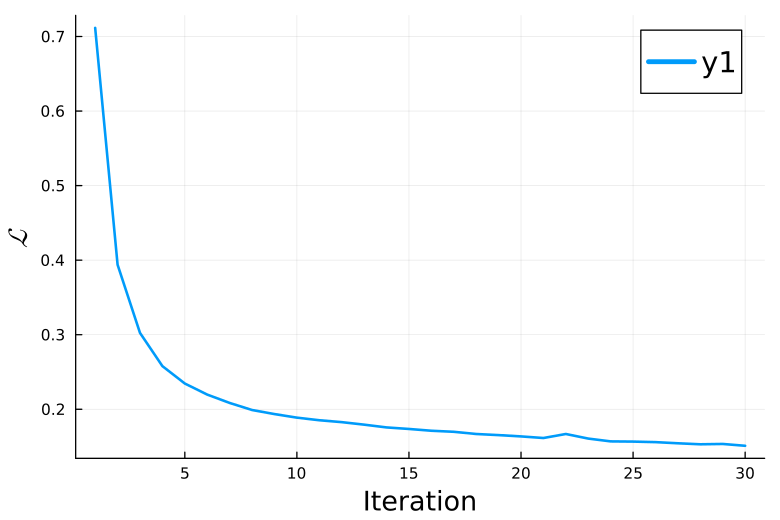

In [26]:

plot(sqrt.(losses),xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15),linewidth = 2)
xlabel!("Iteration")
ylabel!(L"\mathcal{L}")

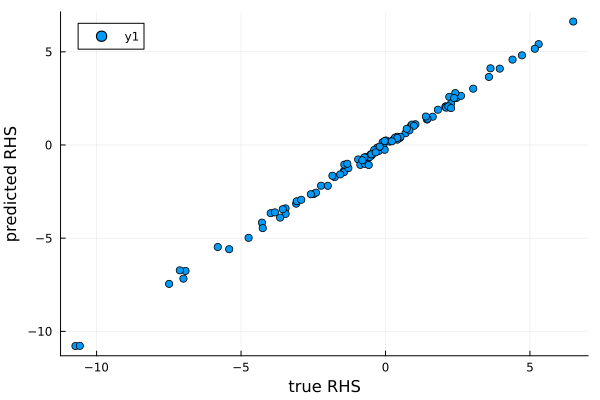

In [27]:
preds = neural_rhs(ref_data,coarse_mesh,0)

select = rand(collect(1:prod(size(ref_rhs_data))),(100))
scatter(ref_rhs_data[select],preds[select])
xlabel!("true RHS")
ylabel!("predicted RHS")

# Trajectory fitting

In [28]:
simulation_indexes = collect(1:size(sim_data)[end-1])'
simulation_indexes = cat([simulation_indexes for i in 1:size(sim_data)[end]]...,dims = fine_mesh.dims + 2)
simulation_indexes = simulation_indexes[1:end]
simulation_times = t_data[1:end]

ref_data_trajectory = reshape(ref_data,(size(ref_data)[1:coarse_mesh.dims+1]...,size(sim_data)[end-1],size(sim_data)[end]))
        

sim_interpolator = gen_time_interpolator(t_data,ref_data_trajectory)





(::var"#interpolator_function#172"{Array{Float64, 5}, Array{Float32, 5}, var"#interpolator_function#161#173"}) (generic function with 1 method)

In [29]:
# remove data that lies at the end of the simulation
buffer_dt = 0.5
select = buffer_dt .< maximum(simulation_times) .- simulation_times

traj_data = ref_data[[(:) for i in 1:coarse_mesh.dims+1]...,select]
traj_indexes = simulation_indexes[select]
traj_times = simulation_times[select]

945-element Vector{Float64}:
 0.05
 0.05
 0.05
 0.05
 0.05
 0.09999999999999999
 0.09999999999999999
 0.09999999999999999
 0.09999999999999999
 0.09999999999999999
 0.15
 0.15
 0.15
 ⋮
 9.349999999999845
 9.349999999999845
 9.399999999999844
 9.399999999999844
 9.399999999999844
 9.399999999999844
 9.399999999999844
 9.449999999999843
 9.449999999999843
 9.449999999999843
 9.449999999999843
 9.449999999999843

In [30]:
traj_dt = 0.05
traj_steps = 10

function trajectory_fitting_loss(input,indexes,times,dt = traj_dt,steps = traj_steps,sim_interpolator = sim_interpolator,neural_rhs = neural_rhs,coarse_mesh = coarse_mesh)
    dims = length(size(input)) - 2
    
    t_start = reshape(times,([1 for i in 1:dims+1]...,size(times)[1]))
    t_end =  t_start .+ steps *dt
    t,result = simulate(input,coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = 1,pre_allocate = false) 
    reference = stop_gradient() do
        sim_interpolator(t,simulation_indexes = indexes)
    end
    return Flux.Losses.mse(result,reference)
end    
    
    
    
    

trajectory_fitting_loss (generic function with 6 methods)

In [31]:
batchsize = 20
trajectory_fitting_data_loader = Flux.Data.DataLoader((traj_data,traj_indexes,traj_times), batchsize=batchsize,shuffle=true)

48-element DataLoader(::Tuple{Array{Float32, 4}, Vector{Int64}, Vector{Float64}}, shuffle=true, batchsize=20)
  with first element:
  (10×10×5×20 Array{Float32, 4}, 20-element Vector{Int64}, 20-element Vector{Float64},)

In [32]:
opt = ADAM()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [33]:
select = rand(collect(1:prod(size(traj_indexes))),(200))
sqrt.(trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select]))

0.03245888114319843

In [34]:
ps = Flux.params(model.CNN,model.B_mats...)
epochs =5
losses = zeros(epochs)
for epoch in tqdm(1:epochs)
    Flux.train!(trajectory_fitting_loss,ps, trajectory_fitting_data_loader, opt)
    train_loss = trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select])
    losses[epoch] = train_loss
end

0.0%┣                                                ┫ 0/5 [00:00<00:00, -0s/it]
20.0%┣████████▋                                  ┫ 1/5 [01:18<Inf:Inf, InfGs/it]
40.0%┣██████████████████▍                           ┫ 2/5 [02:10<06:30, 130s/it]


LoadError: TaskFailedException

[91m    nested task error: [39mInterruptException:

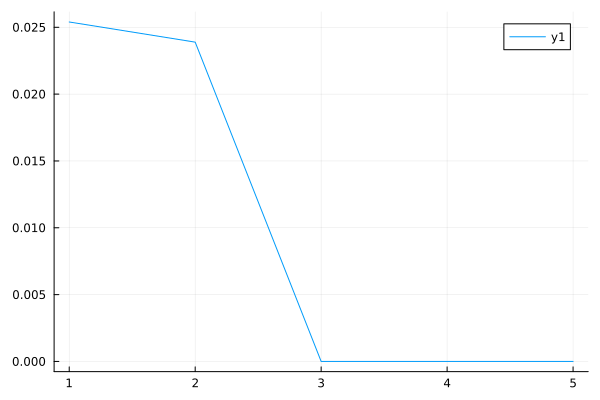

In [35]:
plot(sqrt.(losses))

In [36]:
save_skew_model(model, "my_model")
model = load_skew_model("my_model")


Model saved at directory [my_model]

Model loaded from directory [my_model]


skew_model_struct(var"#NN#198"{String, Bool, Bool, Bool, Int64, Tuple{Int64, Int64}, var"#NN#192#199", Vector{Array{Float64, 4}}, Chain{Tuple{Conv{2, 2, typeof(relu), Array{Float32, 4}, Vector{Float32}}, Conv{2, 2, typeof(identity), Array{Float32, 4}, Vector{Float32}}}}}(Core.Box(1), "c", true, true, true, 5, (1, 1), var"#NN#192#199"(Core.Box([0.1739916205406189 -0.16287146508693695 -0.24077576398849487; -0.2357344776391983 0.16247126460075378 0.1367674320936203; -0.18177422881126404 -0.11714543402194977 -0.24678078293800354;;; 0.052538588643074036 -0.17924848198890686 -0.05724646523594856; 0.07215268164873123 0.2079438716173172 -0.020988989621400833; 0.025174599140882492 0.24707329273223877 0.022824106737971306;;; -0.06557025015354156 0.1592608541250229 -0.016335221007466316; -0.18618813157081604 0.004607906565070152 -0.08510243892669678; -0.11286071687936783 0.0945548266172409 0.21828892827033997;;; 0.2310105264186859 -0.03693100064992905 0.1165538802742958; 0.2352093756198883 -0.236

# Online testing

In [52]:
max_k = 10
energy_norm = 1
number_of_simulations = 1

new_init_conds = generate_random_field(fine_mesh.N,max_k,norm = energy_norm,samples = (1,number_of_simulations))


100×100×1×1 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.67999    -1.425      -1.9273     …   1.47108     0.932953   0.16325
 -1.10281    -1.78567    -2.17447        1.23898     0.580123  -0.257225
 -1.42252    -1.99028    -2.2287         0.934684    0.207155  -0.636339
 -1.61055    -2.02179    -2.08815        0.592588   -0.149058  -0.938818
 -1.66144    -1.89236    -1.78399        0.244187   -0.46041   -1.14534
 -1.58957    -1.63654    -1.3704     …  -0.0867321  -0.710231  -1.25245
 -1.42213    -1.30076    -0.910853      -0.384904   -0.892247  -1.26877
 -1.19071    -0.932207   -0.464352      -0.641015   -1.00692   -1.20934
 -0.924091   -0.5697     -0.0749871     -0.847611   -1.05707   -1.09005
 -0.643873   -0.238766    0.233377      -0.995816   -1.04471   -0.923961
 -0.363827    0.0487373   0.456732   …  -1.07475    -0.970528  -0.72074
 -0.0924036   0.291161    0.606008      -1.07435    -0.836236  -0.488762
  0.163053    0.491557    0.699679      -0.990799   -0.648733  -0.238887
  ⋮         

# Compute reference

In [53]:
t_start = 0
t_end = 5
dt = 0.05
save_every = 1
pre_allocate = true


t,test_sim = simulate(new_init_conds,fine_mesh,dt,t_start,t_end,rhs,time_step,save_every = save_every,pre_allocate = pre_allocate) 
0
t_test = t[1:end]
test_sim = test_sim[:,:,:,1,:]
W_test_sim = PO.W(test_sim)

10×10×5×100 Array{Float32, 4}:
[:, :, 1, 1] =
 -0.539274    0.0380359   0.429907   …  -0.224975   -0.516716    0.423212
  0.335988    0.478303   -0.164894      -0.555879   -0.229423    0.138408
  0.180613   -0.113469    0.582013       0.0641792  -0.123878   -0.451554
 -0.166672    0.133704    1.332          0.206685    0.0794406  -0.551988
  0.0392672   0.0799342   0.0473388     -0.832844    0.256059    0.449226
 -0.172387   -0.14103     0.67334    …   0.631612    1.0134     -0.0562052
  0.344134   -0.342441   -0.0664911     -0.157726    0.622191    0.603323
 -0.0310573   0.0982607  -0.259119       0.285187    0.377963   -0.181686
 -0.405072    0.40154     0.55929       -0.263214    0.233741    0.537538
 -0.360571   -0.766484    0.252208       0.0411763  -0.215      -0.457151

[:, :, 2, 1] =
  0.782565    -0.282184   0.0295387  …  -0.261517    0.444777   0.330117
 -0.0456022    0.441426  -0.312465      -0.281023    1.19638   -0.822635
  0.56751     -0.55532    0.0301018      0.58948   

# Compute prediction

In [54]:
t_start = 0
t_end = 5
dt = 0.05
save_every = 1
pre_allocate = true


t,pred_sim = simulate(PO.W(new_init_conds),coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = save_every,pre_allocate = pre_allocate) 
t_pred = t[1:end]
pred_sim = pred_sim[:,:,:,1,:]

R_pred_sim = PO.R(pred_sim)

100×100×1×100 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.0965979  -0.38288    -0.661476    …   1.12316    1.3399      1.38988
 -0.434528   -0.771565   -1.07112         1.2967     1.47409     1.48582
 -0.786509   -1.1485     -1.43934         1.38347    1.49282     1.45058
 -1.0989     -1.45502    -1.70609         1.35632    1.37665     1.27211
 -1.32361    -1.6432     -1.82744         1.20625    1.12846     0.962961
 -1.42794    -1.68578    -1.78494     …   0.945683   0.774569    0.559549
 -1.40096    -1.58147    -1.58936         0.607219   0.360855    0.116151
 -1.25497    -1.3545     -1.27791         0.237815  -0.0556085  -0.305188
 -1.02182    -1.04855    -0.905671       -0.110273  -0.417479   -0.646615
 -0.745225   -0.716702   -0.533499       -0.389789  -0.678235   -0.865621
 -0.489141   -0.421472   -0.286546    …  -0.33469   -0.362635   -0.248302
 -0.401438   -0.311651   -0.163537       -0.734843  -0.732904   -0.567509
 -0.242682   -0.138378    0.00923669     -1.08077   -1.04088    -0.8

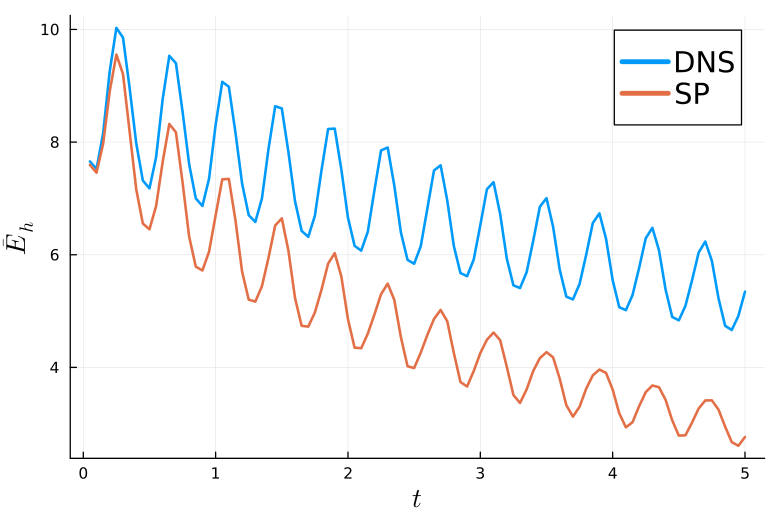

In [55]:
plot(t_test,coarse_mesh.ip(W_test_sim,W_test_sim,combine_channels = false)[1,1,1,:],label = "DNS",linewidth = 2,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(t_pred,coarse_mesh.ip(pred_sim,pred_sim,combine_channels = false)[1,1,1,:],label = "SP",linewidth = 2)
ylabel!(L"$\bar{E}_h$")
xlabel!(L"t")

┌ Warning: scale log is unsupported with Plots.GRBackend().
│ Choose from: [:identity, :ln, :log10, :log2]
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/args.jl:1584
┌ Warning: scale log is unsupported with Plots.GRBackend().
│ Choose from: [:identity, :ln, :log10, :log2]
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/args.jl:1584


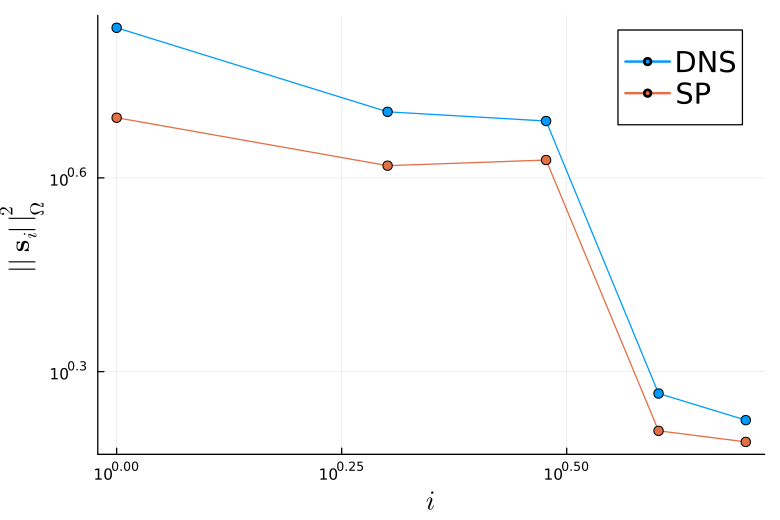

In [56]:
plot(mean(coarse_mesh.ip(W_test_sim,W_test_sim,combine_channels = false),dims = [1,2,4])[1:end],yscale = :log,label = "DNS",marker = true,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15),xscale = :log)
plot!(mean(coarse_mesh.ip(pred_sim,pred_sim,combine_channels = false),dims = [1,2,4])[1:end],label = "SP",marker = true)
xlabel!(L"i")
ylabel!(L"||\mathbf{s}_i||^2_\Omega")

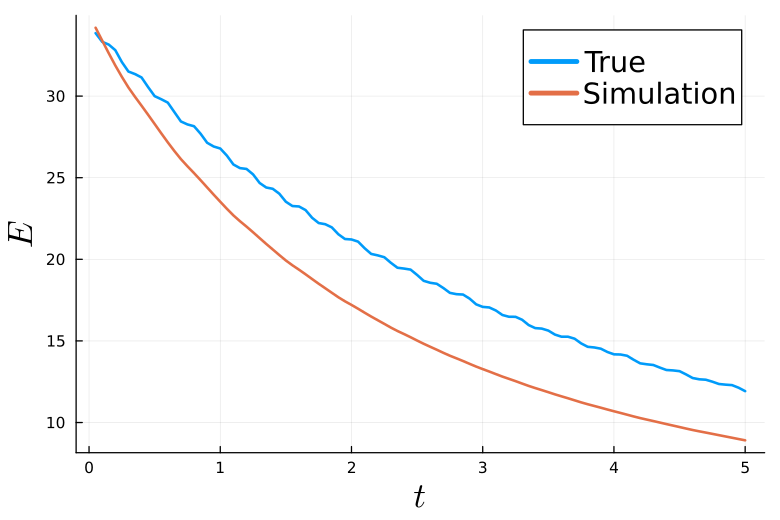

In [57]:
E_ref = fine_mesh.ip(test_sim,test_sim)[1:end]
E_ref = coarse_mesh.ip(PO.W(test_sim),PO.W(test_sim),combine_channels = true)[1:end]
plot(t_test,E_ref,label = "True",linewidth = 2,xguidefontsize=18,yguidefontsize=18 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(t_pred,E_pred,label = "Simulation",linewidth = 2)
ylabel!(L"$E$")
xlabel!(L"t")

[ Info: Saved animation to /home/toby/Projects/Local_POD/Test_local_POD/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD/Test_local_POD/DNS_flow.gif")
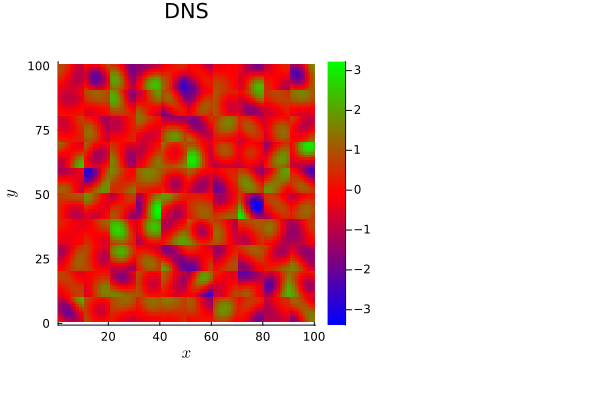

In [60]:
to_plot = PO.R(PO.W(test_sim))

ymin = minimum(to_plot)
ymax = maximum(to_plot)

anim = @animate for index in 1:size(to_plot)[4]
    #heatmap(to_plot[:,:,1,index],color = :brg,clim = (ymin,ymax))
    heatmap(to_plot[:,:,1,index],color = :brg,aspect_ratio = :equal,right_margin =55Plots.mm)
    xlabel!(L"x")
    ylabel!(L"y")
    title!("DNS")
    
end


gif(anim, "DNS_flow.gif", fps = 10)

[ Info: Saved animation to /home/toby/Projects/Local_POD/Test_local_POD/SP_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD/Test_local_POD/SP_flow.gif")
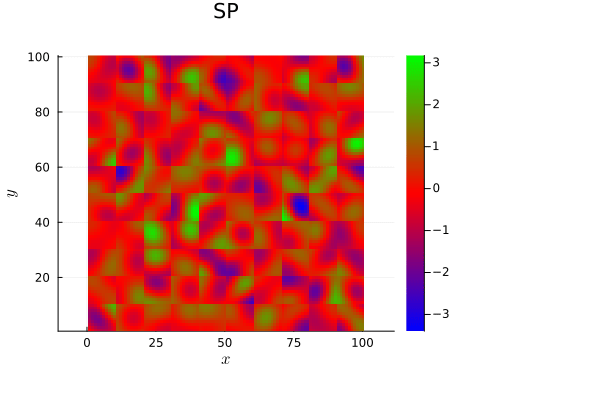

In [61]:
to_plot = R_pred_sim

ymin = minimum(to_plot)
ymax = maximum(to_plot)

anim = @animate for index in 1:size(to_plot)[4]
    #heatmap(to_plot[:,:,1,index],color = :brg,clim = (ymin,ymax))
    heatmap(to_plot[:,:,1,index],color = :brg,aspect_ratio = :equal,right_margin =35Plots.mm)
    xlabel!(L"x")
    ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
    title!("SP")
end


gif(anim, "SP_flow.gif", fps = 10)